In [1]:
!pip install EMD-signal

In [2]:
!pip install scipy

In [51]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [52]:
from PyEMD import EMD
from scipy.signal import hilbert
import concurrent.futures

In [53]:
df=pd.read_csv("resampled_dataset.csv")

In [54]:
df.head()

,0,1,2,3,4,5,6,7,8,9,...,171,172,173,174,175,176,177,178,179,target
0,-0.021396,-0.024454,-0.025602,-0.033167,-0.046346,-0.053598,-0.041849,-0.008744,0.033132,0.064087,...,-0.203703,-0.216824,-0.231263,-0.232960,-0.217436,-0.192561,-0.171586,-0.161772,-0.157843,0
1,-0.065446,-0.113605,-0.132356,-0.123176,-0.099631,-0.076035,-0.058774,-0.046599,-0.037302,-0.032211,...,0.706370,0.737433,0.751696,0.740411,0.709222,0.674496,0.652666,0.651250,0.668388,0
2,0.597245,0.609343,0.616054,0.615580,0.608934,0.599329,0.589872,0.581167,0.570926,0.556225,...,-0.466576,-0.448324,-0.431047,-0.414286,-0.397562,-0.381062,-0.365116,-0.348965,-0.330484,0
3,0.415356,0.406773,0.396699,0.385015,0.369871,0.351091,0.332162,0.318586,0.313899,0.316959,...,-0.344787,-0.327214,-0.311647,-0.297288,-0.281039,-0.260373,-0.235751,-0.210348,-0.187324,0
4,-0.077010,-0.054180,-0.015751,0.032942,0.078915,0.109189,0.121749,0.128960,0.148012,0.185541,...,0.599737,0.647817,0.692601,0.719140,0.728292,0.733303,0.746571,0.769504,0.793682,0


In [55]:
df.shape


(50000, 181)

In [56]:
sampling_rate = 1000  # Hz

selected_data=df.iloc[:50001,:]

In [57]:
selected_data.head()

,0,1,2,3,4,5,6,7,8,9,...,171,172,173,174,175,176,177,178,179,target
0,-0.021396,-0.024454,-0.025602,-0.033167,-0.046346,-0.053598,-0.041849,-0.008744,0.033132,0.064087,...,-0.203703,-0.216824,-0.231263,-0.232960,-0.217436,-0.192561,-0.171586,-0.161772,-0.157843,0
1,-0.065446,-0.113605,-0.132356,-0.123176,-0.099631,-0.076035,-0.058774,-0.046599,-0.037302,-0.032211,...,0.706370,0.737433,0.751696,0.740411,0.709222,0.674496,0.652666,0.651250,0.668388,0
2,0.597245,0.609343,0.616054,0.615580,0.608934,0.599329,0.589872,0.581167,0.570926,0.556225,...,-0.466576,-0.448324,-0.431047,-0.414286,-0.397562,-0.381062,-0.365116,-0.348965,-0.330484,0
3,0.415356,0.406773,0.396699,0.385015,0.369871,0.351091,0.332162,0.318586,0.313899,0.316959,...,-0.344787,-0.327214,-0.311647,-0.297288,-0.281039,-0.260373,-0.235751,-0.210348,-0.187324,0
4,-0.077010,-0.054180,-0.015751,0.032942,0.078915,0.109189,0.121749,0.128960,0.148012,0.185541,...,0.599737,0.647817,0.692601,0.719140,0.728292,0.733303,0.746571,0.769504,0.793682,0


In [58]:
selected_data.drop('target',axis=1,inplace=True)

C:\Users\sesid\AppData\Local\Temp\ipykernel_7892\3561901364.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  selected_data.drop('target',axis=1,inplace=True)


In [59]:
selected_data.tail()

,0,1,2,3,4,5,6,7,8,9,...,170,171,172,173,174,175,176,177,178,179
49995,-0.385431,-0.297424,-0.229571,-0.206824,-0.228802,-0.272528,-0.306999,-0.309526,-0.274915,-0.214711,...,-1.671278,-1.636884,-1.559731,-1.465608,-1.387907,-1.345385,-1.330345,-1.315461,-1.274482,-1.201553
49996,-0.162890,-0.165985,-0.193124,-0.238380,-0.288174,-0.326636,-0.340490,-0.321482,-0.267121,-0.181870,...,-1.330092,-1.314777,-1.294368,-1.260296,-1.207267,-1.137111,-1.057969,-0.980277,-0.912467,-0.858616
49997,0.807767,0.829485,0.840042,0.837663,0.823102,0.798793,0.768186,0.735599,0.705827,0.682617,...,-2.217640,-2.272672,-2.328628,-2.385042,-2.441449,-2.496203,-2.546342,-2.588822,-2.622225,-2.647688
49998,-0.202739,-0.205532,-0.201796,-0.194661,-0.188023,-0.185132,-0.187517,-0.194745,-0.205245,-0.217566,...,-1.728036,-1.716907,-1.698024,-1.674695,-1.650359,-1.627192,-1.605442,-1.583611,-1.559141,-1.529148
49999,0.541021,0.564576,0.596469,0.633166,0.670067,0.702851,0.728489,0.745690,0.754664,0.756490,...,-1.984827,-1.994296,-1.995830,-1.990164,-1.978657,-1.964978,-1.955695,-1.958299,-1.977343,-2.011063


In [60]:
sampling_rate = 1000

In [61]:
selected_data.shape

(50000, 180)

In [62]:
def hilbert_transform(imfs, sampling_rate):
    analytical_signal = hilbert(imfs)
    amplitude_envelope = np.abs(analytical_signal)
    instantaneous_phase = np.unwrap(np.angle(analytical_signal))
    instantaneous_frequency = (np.diff(instantaneous_phase) / (2.0 * np.pi) * sampling_rate)
    return amplitude_envelope, instantaneous_frequency

In [63]:
def process_row(row_index, row, sampling_rate):
    try:
        signal = row.values
        emd = EMD()
        imfs = emd(signal)
        num_imfs = len(imfs)
        row_results = []
        for imf in imfs:
            amplitude_envelope, instantaneous_frequency = hilbert_transform(imf, sampling_rate)
            row_results.append({
                "imf": imf,
                "amplitude_envelope": amplitude_envelope,
                "instantaneous_frequency": instantaneous_frequency
            })
        return row_index, num_imfs, row_results
    except Exception as e:
        print(f"Error processing row {row_index}: {e}")
        return row_index, 0, []

In [64]:
hvd_results = []
with concurrent.futures.ThreadPoolExecutor() as executor:
    # Submit tasks
    futures = {executor.submit(process_row, index, row, sampling_rate): index for index, row in selected_data.iterrows()}
    for future in concurrent.futures.as_completed(futures):
        try:
            row_index, num_imfs, row_results = future.result()
            hvd_results.append((row_index, num_imfs, row_results))
        except Exception as e:
            print(f"Error in future result: {e}")

In [65]:
# Sort results by row index (optional)
hvd_results.sort(key=lambda x: x[0])

# Print results for verification and plot IMFs
for row_index, num_imfs, row_results in hvd_results:
    print(f"Row {row_index} has {num_imfs} IMFs")

    # #Plot the IMFs for the current row
    # plt.figure()
    # num_plots = num_imfs * 3
    # for i, result in enumerate(row_results):
    #     imf = result["imf"]
    #     amplitude_envelope = result["amplitude_envelope"]
    #     instantaneous_frequency = result["instantaneous_frequency"]
        
    #     plt.subplot(num_plots, 1, 3 * i + 1)
    #     plt.plot(imf)
    #     plt.title(f"Row {row_index} - IMF {i + 1}")

    #     plt.subplot(num_plots, 1, 3 * i + 2)
    #     plt.plot(amplitude_envelope)
    #     plt.title(f"Row {row_index} - IMF {i + 1} Amplitude Envelope")

    #     plt.subplot(num_plots, 1, 3 * i + 3)
    #     plt.plot(instantaneous_frequency)
    #     plt.title(f"Row {row_index} - IMF {i + 1} Instantaneous Frequency")

    # plt.tight_layout()
    # plt.show()

Row 0 has 5 IMFs
Row 1 has 4 IMFs
Row 2 has 4 IMFs
Row 3 has 4 IMFs
Row 4 has 4 IMFs
Row 5 has 4 IMFs
Row 6 has 4 IMFs
Row 7 has 5 IMFs
Row 8 has 4 IMFs
Row 9 has 4 IMFs
Row 10 has 4 IMFs
Row 11 has 4 IMFs
Row 12 has 5 IMFs
Row 13 has 4 IMFs
Row 14 has 5 IMFs
Row 15 has 4 IMFs
Row 16 has 4 IMFs
Row 17 has 4 IMFs
Row 18 has 4 IMFs
Row 19 has 4 IMFs
Row 20 has 4 IMFs
Row 21 has 4 IMFs
Row 22 has 4 IMFs
Row 23 has 4 IMFs
Row 24 has 4 IMFs
Row 25 has 4 IMFs
Row 26 has 5 IMFs
Row 27 has 4 IMFs
Row 28 has 5 IMFs
Row 29 has 4 IMFs
Row 30 has 3 IMFs
Row 31 has 5 IMFs
Row 32 has 3 IMFs
Row 33 has 4 IMFs
Row 34 has 4 IMFs
Row 35 has 4 IMFs
Row 36 has 4 IMFs
Row 37 has 5 IMFs
Row 38 has 5 IMFs
Row 39 has 4 IMFs
Row 40 has 3 IMFs
Row 41 has 4 IMFs
Row 42 has 4 IMFs
Row 43 has 4 IMFs
Row 44 has 4 IMFs
Row 45 has 3 IMFs
Row 46 has 4 IMFs
Row 47 has 4 IMFs
Row 48 has 4 IMFs
Row 49 has 4 IMFs
Row 50 has 3 IMFs
Row 51 has 4 IMFs
Row 52 has 4 IMFs
Row 53 has 4 IMFs
Row 54 has 4 IMFs
Row 55 has 5 IMFs
Ro

Row 42218 has 3 IMFs
Row 42219 has 5 IMFs
Row 42220 has 4 IMFs
Row 42221 has 5 IMFs
Row 42222 has 4 IMFs
Row 42223 has 5 IMFs
Row 42224 has 4 IMFs
Row 42225 has 5 IMFs
Row 42226 has 5 IMFs
Row 42227 has 4 IMFs
Row 42228 has 3 IMFs
Row 42229 has 4 IMFs
Row 42230 has 5 IMFs
Row 42231 has 4 IMFs
Row 42232 has 4 IMFs
Row 42233 has 5 IMFs
Row 42234 has 5 IMFs
Row 42235 has 4 IMFs
Row 42236 has 4 IMFs
Row 42237 has 3 IMFs
Row 42238 has 5 IMFs
Row 42239 has 5 IMFs
Row 42240 has 5 IMFs
Row 42241 has 5 IMFs
Row 42242 has 4 IMFs
Row 42243 has 4 IMFs
Row 42244 has 4 IMFs
Row 42245 has 4 IMFs
Row 42246 has 5 IMFs
Row 42247 has 5 IMFs
Row 42248 has 4 IMFs
Row 42249 has 5 IMFs
Row 42250 has 4 IMFs
Row 42251 has 4 IMFs
Row 42252 has 5 IMFs
Row 42253 has 4 IMFs
Row 42254 has 5 IMFs
Row 42255 has 5 IMFs
Row 42256 has 4 IMFs
Row 42257 has 5 IMFs
Row 42258 has 4 IMFs
Row 42259 has 4 IMFs
Row 42260 has 5 IMFs
Row 42261 has 5 IMFs
Row 42262 has 4 IMFs
Row 42263 has 4 IMFs
Row 42264 has 5 IMFs
Row 42265 has

C:\Users\sesid\AppData\Local\Temp\ipykernel_7892\1399398197.py:26: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  plt.tight_layout()


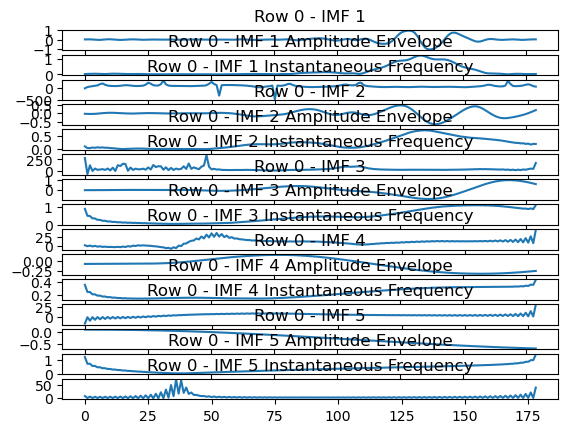

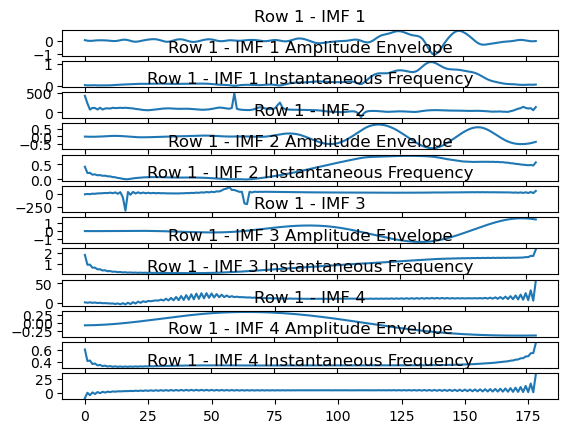

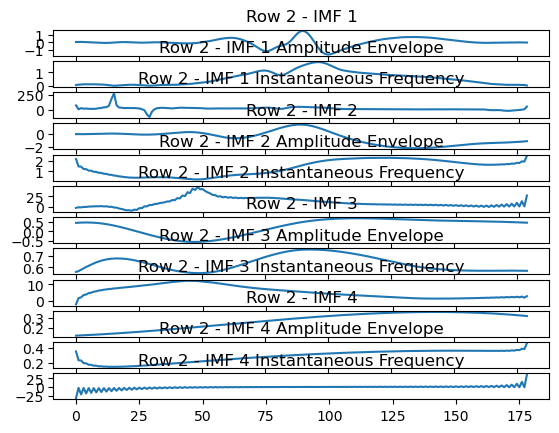

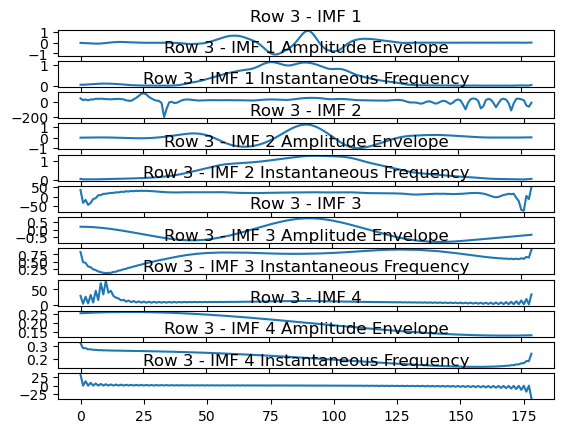

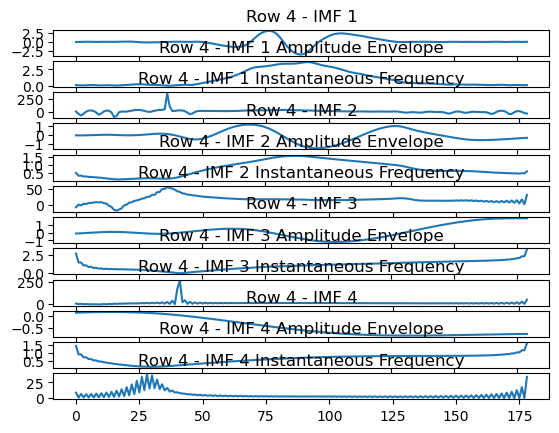

...

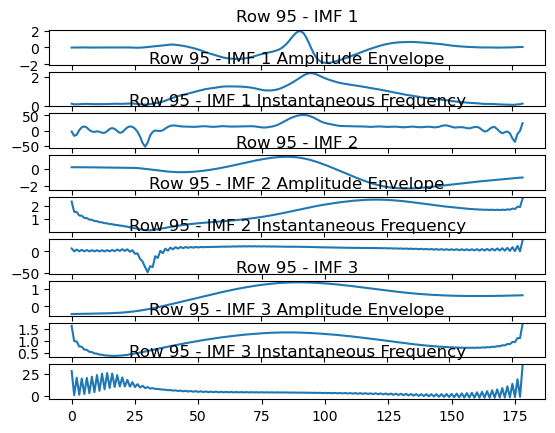

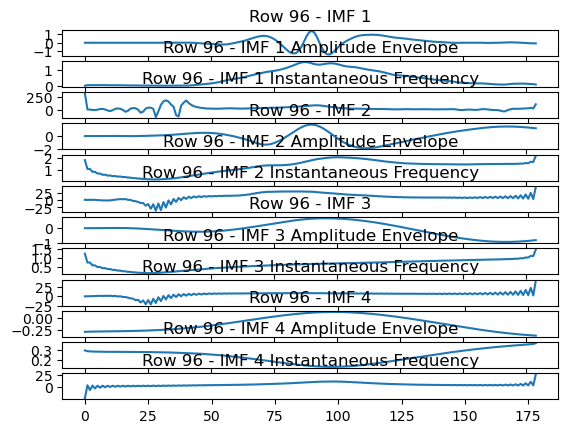

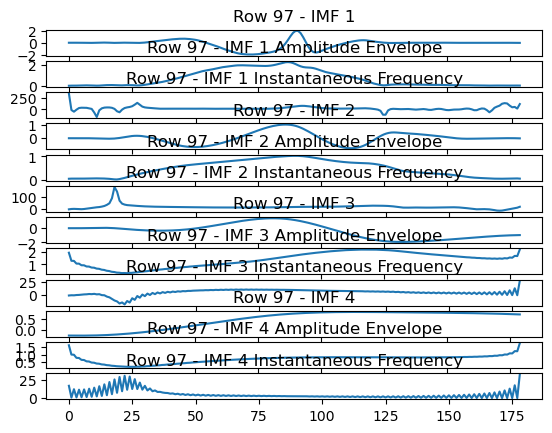

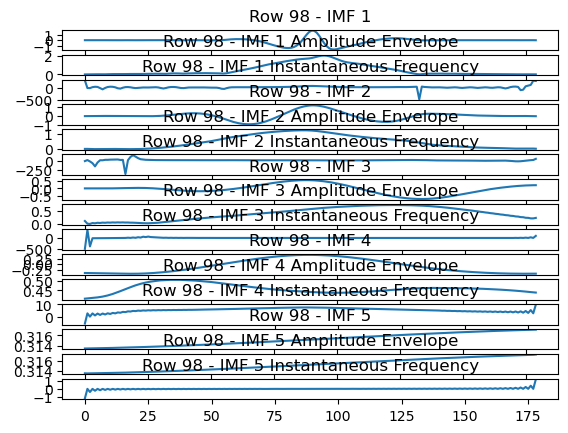

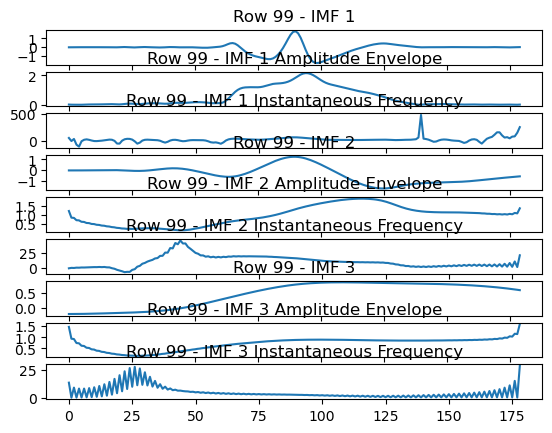

In [66]:
row_counter = 0

# Print results for verification and plot IMFs
for row_index, num_imfs, row_results in hvd_results:
    if row_counter >= 100:
        break  # Stop after processing 100 rows
    plt.figure()
    num_plots = num_imfs * 3
    for i, result in enumerate(row_results):
        imf = result["imf"]
        amplitude_envelope = result["amplitude_envelope"]
        instantaneous_frequency = result["instantaneous_frequency"]

        plt.subplot(num_plots, 1, 3 * i + 1)
        plt.plot(imf)
        plt.title(f"Row {row_index} - IMF {i + 1}")

        plt.subplot(num_plots, 1, 3 * i + 2)
        plt.plot(amplitude_envelope)
        plt.title(f"Row {row_index} - IMF {i + 1} Amplitude Envelope")

        plt.subplot(num_plots, 1, 3 * i + 3)
        plt.plot(instantaneous_frequency)
        plt.title(f"Row {row_index} - IMF {i + 1} Instantaneous Frequency")

    plt.tight_layout()
    plt.show()

    row_counter += 1

In [67]:
import numpy as np

def calculate_features(imf):
    energy = np.sum(np.square(imf))
    mean_val = np.mean(imf)
    variance = np.var(imf)
    amplitude = np.ptp(imf)  # Peak-to-peak (max-min)
    signal_to_noise_ratio =  np.mean(np.abs(imf))/np.std(imf)  if np.mean(np.abs(imf)) != 0 else np.inf
    return energy, mean_val, variance, amplitude, signal_to_noise_ratio


In [68]:
def normalize_features(features):
    # Avoid division by zero by using np.where
    mean_features = np.mean(features, axis=0)
    std_features = np.std(features, axis=0)
    std_features = np.where(std_features == 0, 1, std_features)
    normalized = (features - mean_features) / std_features
    return normalized, mean_features, std_features

In [69]:
def calculate_importance_score(normalized_features, weights=None):
    if weights is None:
        weights = np.ones(normalized_features.shape[1])
    importance_scores = np.dot(normalized_features, weights)
    return importance_scores

In [70]:
def select_important_imf(hvd_result):
    row_idx, num_imfs, imfs = hvd_result
    features_list = []
    
    for imf_dict in imfs:
        imf = imf_dict['imf']
        features = calculate_features(imf)
        features_list.append(features)
    
    features_array = np.array(features_list)
    normalized_features, mean_features, std_features = normalize_features(features_array)
    importance_scores = calculate_importance_score(normalized_features)
    
    most_important_imf_index = np.argmax(importance_scores)
    most_important_imf = imfs[most_important_imf_index]
    most_important_imf_features = features_array[most_important_imf_index]
    most_contributing_feature_index = np.argmax(normalized_features[most_important_imf_index])

    return most_important_imf_index, most_important_imf, most_contributing_feature_index

In [71]:
# Process all rows
important_imfs = []
for hvd_result in hvd_results:
    most_important_imf_index, most_important_imf, most_contributing_feature_index = select_important_imf(hvd_result)
    important_imfs.append((hvd_result[0], most_important_imf_index, most_important_imf, most_contributing_feature_index))

In [72]:
# Output the important IMFs and the most contributing feature
feature_names = ["Energy", "Mean", "Variance", "Amplitude", "Signal-Noise Ratio"]
for row, imf_index, imf, feature_index in important_imfs:
    print(f"Row {row + 1}: Most important IMF is IMF {imf_index + 1} based on {feature_names[feature_index]}")

Row 1: Most important IMF is IMF 3 based on Variance
Row 2: Most important IMF is IMF 3 based on Energy
Row 3: Most important IMF is IMF 2 based on Energy
Row 4: Most important IMF is IMF 2 based on Amplitude
Row 5: Most important IMF is IMF 1 based on Amplitude
Row 6: Most important IMF is IMF 1 based on Amplitude
Row 7: Most important IMF is IMF 3 based on Energy
Row 8: Most important IMF is IMF 4 based on Mean
Row 9: Most important IMF is IMF 1 based on Amplitude
Row 10: Most important IMF is IMF 4 based on Energy
Row 11: Most important IMF is IMF 2 based on Mean
Row 12: Most important IMF is IMF 3 based on Energy
Row 13: Most important IMF is IMF 1 based on Amplitude
Row 14: Most important IMF is IMF 2 based on Mean
Row 15: Most important IMF is IMF 1 based on Amplitude
Row 16: Most important IMF is IMF 2 based on Energy
Row 17: Most important IMF is IMF 2 based on Amplitude
Row 18: Most important IMF is IMF 2 based on Variance
Row 19: Most important IMF is IMF 1 based on Amplitude

In [73]:

# Process all rows to find the most important IMFs and the most contributing features
important_imfs = []
max_imfs = max([result[1] for result in hvd_results])
imf_count = np.zeros(max_imfs)  # Adjust the size according to the max number of IMFs
feature_count = np.zeros(5)  # There are 5 features

for hvd_result in hvd_results:
    most_important_imf_index, most_important_imf, most_contributing_feature_index = select_important_imf(hvd_result)
    important_imfs.append((hvd_result[0], most_important_imf_index, most_important_imf, most_contributing_feature_index))
    imf_count[most_important_imf_index] += 1
    feature_count[most_contributing_feature_index] += 1

# Print the counts
print("Count of important IMFs:")
for i in range(len(imf_count)):
    print(f"IMF {i + 1}: {int(imf_count[i])}")

print("\nCount of important features:")
feature_names = ["Energy", "Mean", "Variance", "Amplitude", "Signal-to-Noise-ratio"]
for i in range(len(feature_count)):
    print(f"{feature_names[i]}: {int(feature_count[i])}")


Count of important IMFs:
IMF 1: 6813
IMF 2: 24856
IMF 3: 15513
IMF 4: 2433
IMF 5: 378
IMF 6: 7

Count of important features:
Energy: 18911
Mean: 7765
Variance: 14265
Amplitude: 7730
Signal-to-Noise-ratio: 1329


In [74]:
def calculate_energy(imf):
    energy =np.sum(np.square(imf))
    variance = np.var(imf)
    amplitude = np.ptp(imf) 
    return energy,variance,amplitude

In [75]:
important_imf_indices = []
for hvd_result in hvd_results:
    most_important_imf_index, _, _ = select_important_imf(hvd_result)
    important_imf_indices.append(most_important_imf_index)

# Step 2: Extract the energy values only for the important IMFs
energy_results = []
for row_index, (hvd_result, imf_index) in enumerate(zip(hvd_results, important_imf_indices)):
    imf = hvd_result[2][imf_index]['imf']
    energy,vaiance,amplitude = calculate_energy(imf)
    energy_results.append((row_index, energy ,vaiance,amplitude))

# Save the energy values in a CSV file
energy_df = pd.DataFrame(energy_results, columns=['Row Index', 'Energy','Variance', 'Amplitude'])
energy_df.to_csv('10results.csv', index=False)
